In [1]:
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

import torch
print(torch.cuda.device_count())      # → 1
print(torch.cuda.get_device_name(0))  # → name of the *second* physical GPU

1
NVIDIA A100-SXM4-40GB


Loading model...
Model loaded on cuda
Total images: 9
Batch size: 4
Number of batches: 3
----------------------------------------------------------------------
20211222_104840_petiole_test2_00300.png
  GT classes: [  0   1   2   3   4   6 255]
  Predicted classes: [0 1 2 3 4 6]


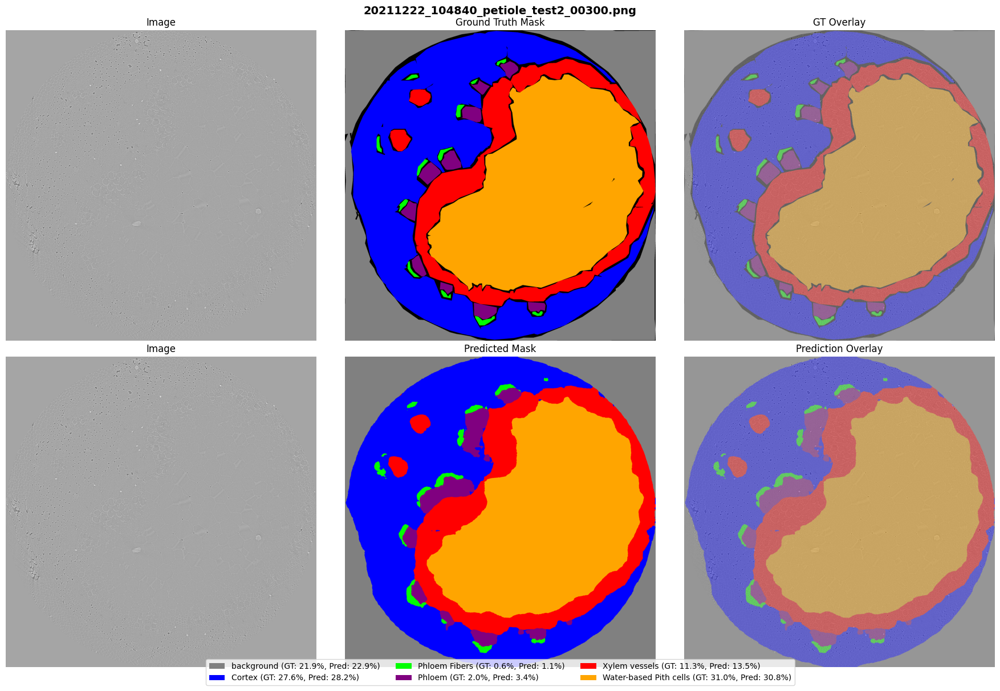

----------------------------------------------------------------------
20211222_104840_petiole_test2_00400.png
  GT classes: [  0   1   2   3   4   6 255]
  Predicted classes: [0 1 2 3 4 6]


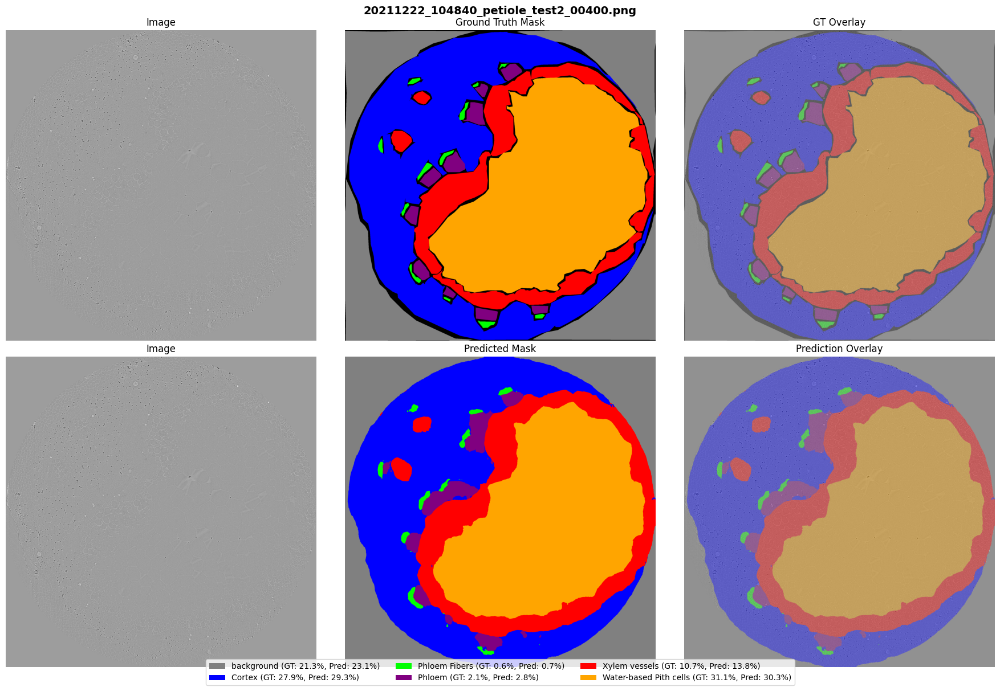

----------------------------------------------------------------------
20211222_113313_petiole3_00200.png
  GT classes: [  0   1   2   3   4   5   6 255]
  Predicted classes: [0 1 2 3 4 5 6]


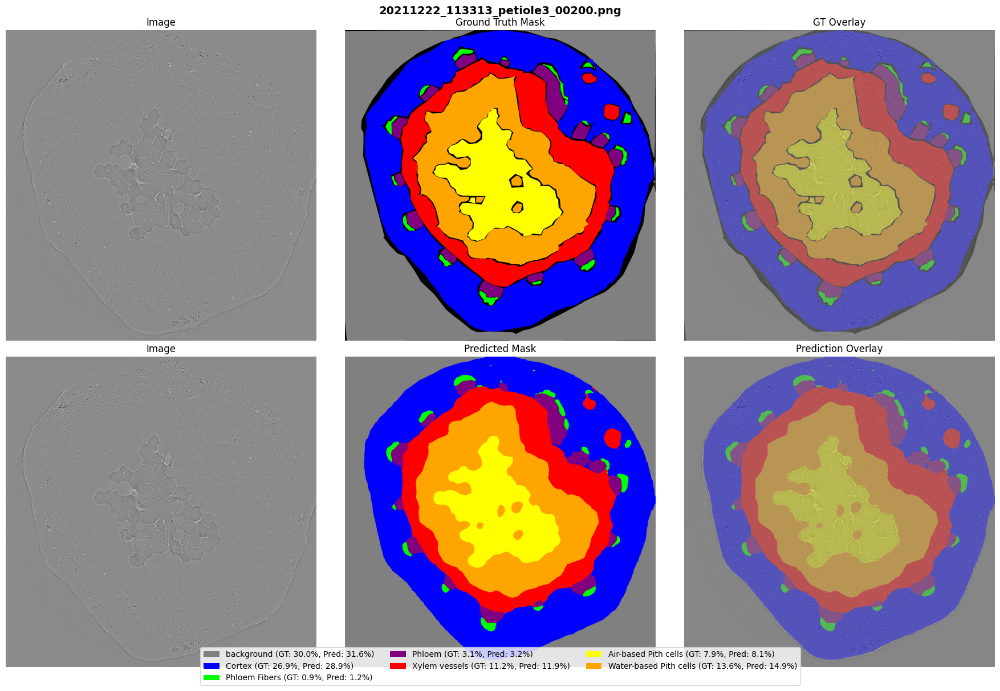

----------------------------------------------------------------------
20211222_113313_petiole3_00500.png
  GT classes: [  0   1   2   3   4   5   6 255]
  Predicted classes: [0 1 2 3 4 5 6]


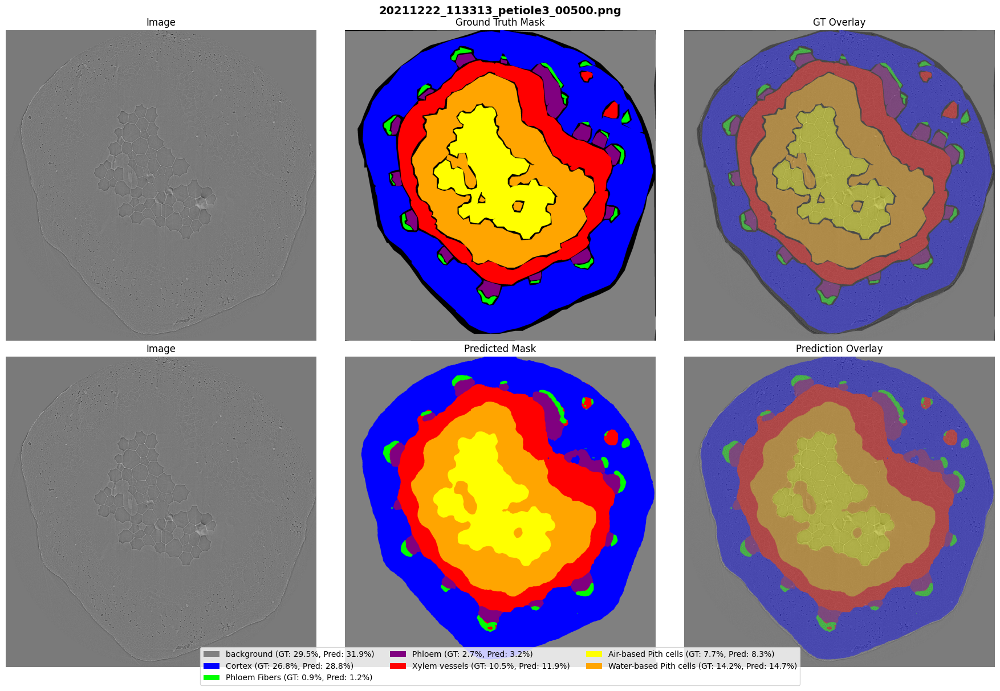

----------------------------------------------------------------------
Completed batch 1/3
20211222_125057_petiole4_00200.png
  GT classes: [  0   1   2   3   4   5   6 255]
  Predicted classes: [0 1 2 3 4 5 6]


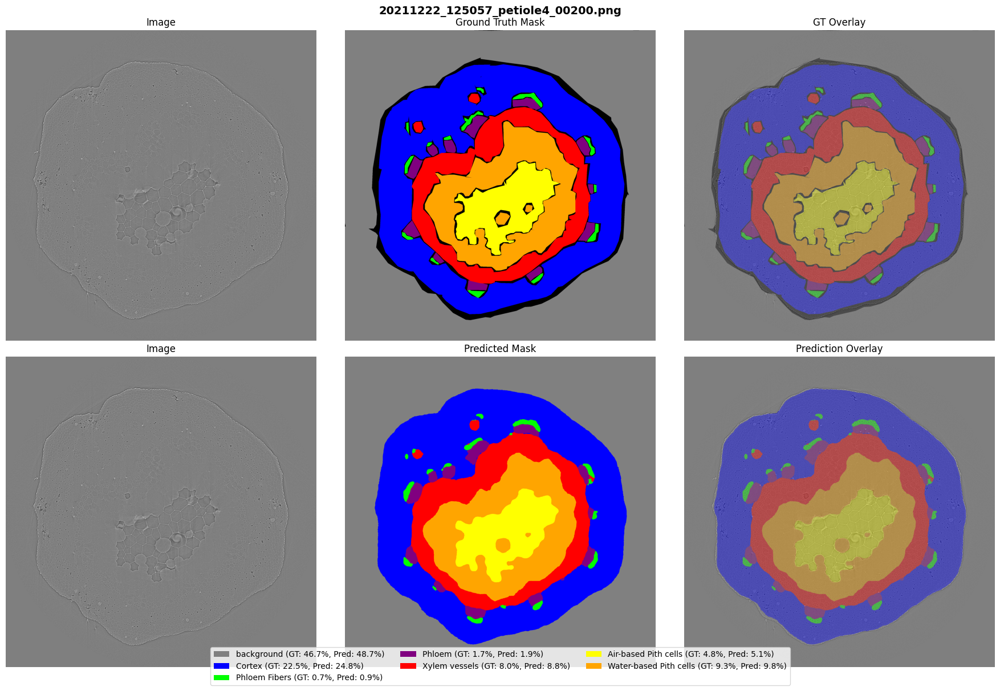

----------------------------------------------------------------------
20260211_134340_petiole3_00100.png
  GT classes: [  0   1   4   6 255]
  Predicted classes: [0 1 2 3 4 6]


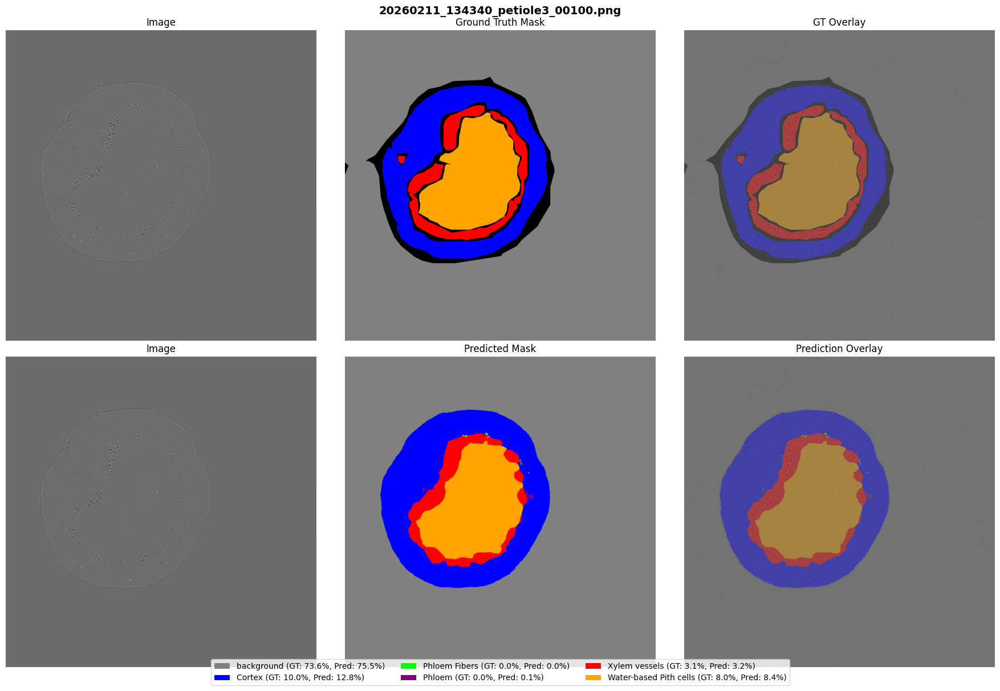

----------------------------------------------------------------------
20260211_162350_petiole10_00100.png
  GT classes: [  0   1   2   3   4   6 255]
  Predicted classes: [0 1 2 3 4 5 6]


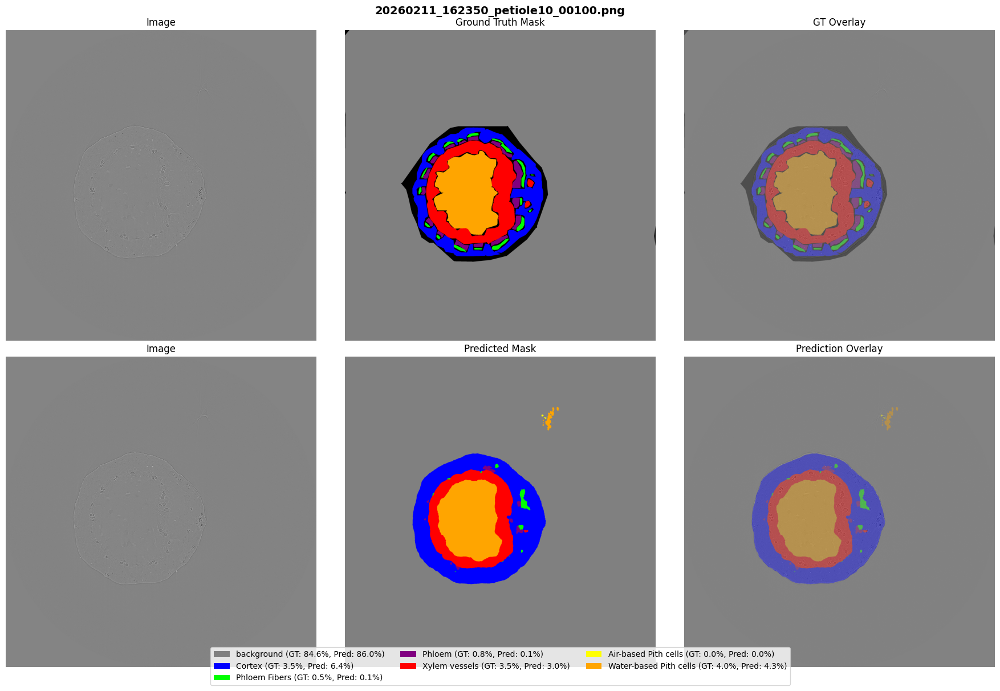

----------------------------------------------------------------------
20260212_151430_petiole33_00100.png
  GT classes: [  0   1   2   3   4   5   6 255]
  Predicted classes: [0 1 2 3 4 5 6]


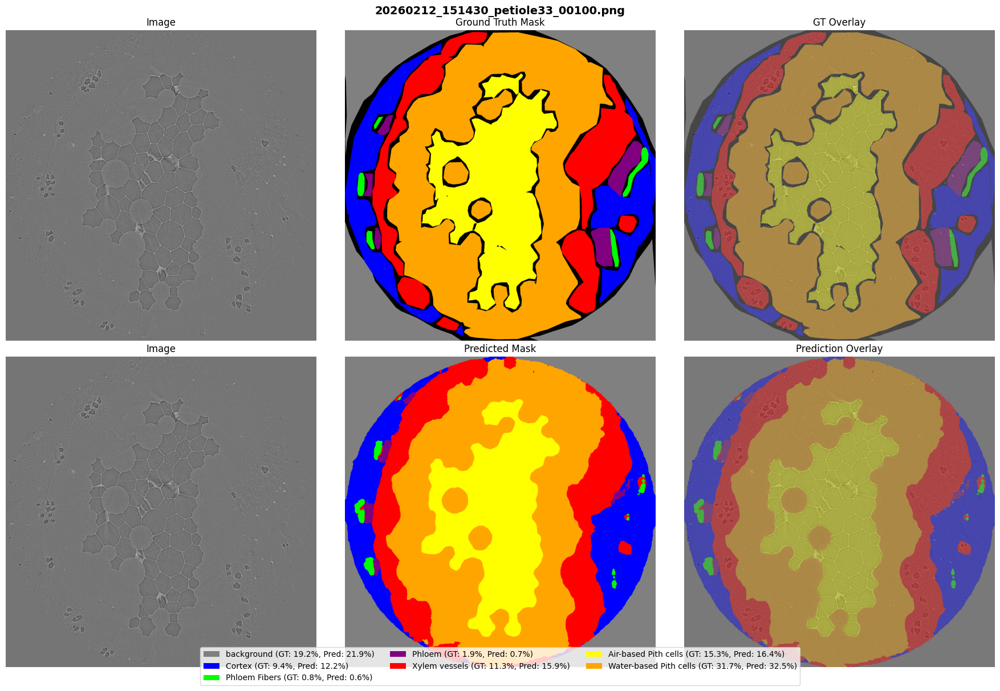

----------------------------------------------------------------------
Completed batch 2/3
20260213_133052_petiole44_00100.png
  GT classes: [  0   1   2   3   4   6 255]
  Predicted classes: [0 1 2 3 4 5 6]


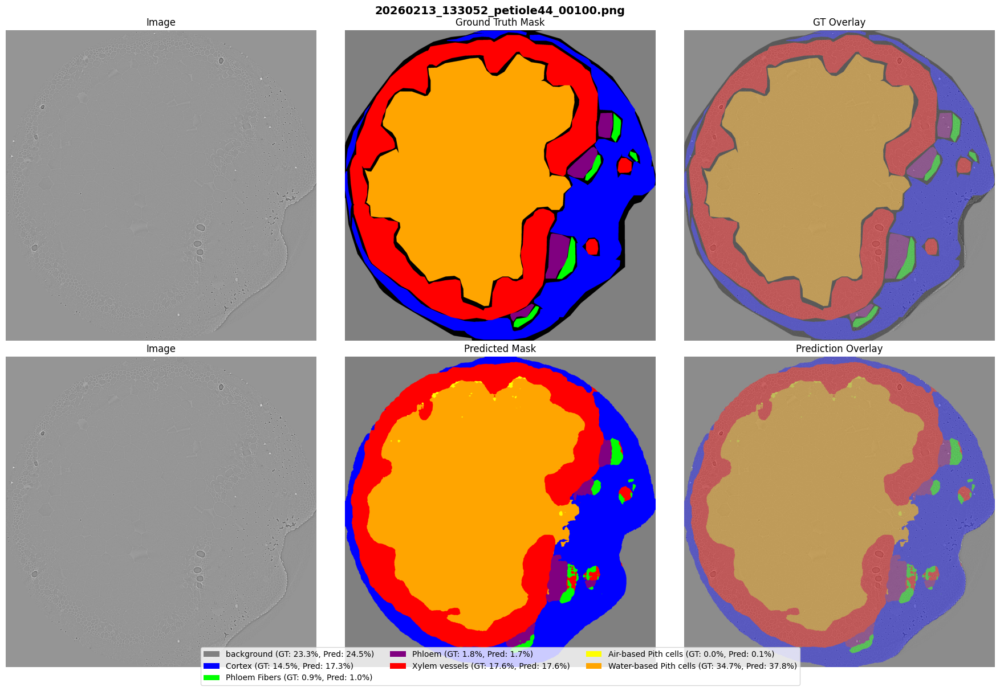

----------------------------------------------------------------------
Completed batch 3/3

Inference complete!


In [3]:
import lightly_train
import torch
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from PIL import Image
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torch.nn.functional as F

# ------------------------
# Class definitions
# ------------------------
CLASS_COLORS = {
    0: [128,128,128],    # gray - background
    1: [0, 0, 255],      # Blue - Cortex
    2: [0, 255, 0],      # Green - Phloem Fibers
    3: [128, 0, 128],    # Purple - Phloem
    4: [255, 0, 0],      # Red - Xylem vessels
    5: [255, 255, 0],    # Yellow - Air-based Pith cells
    6: [255, 165, 0],    # Orange - Water-based Pith cells
}

CLASS_NAMES = {
    0: "background",
    1: "Cortex",
    2: "Phloem Fibers",
    3: "Phloem",
    4: "Xylem vessels",
    5: "Air-based Pith cells",
    6: "Water-based Pith cells",
}

IGNORE_CLASSES = [255]

def mask_to_color(mask_array):
    """
    Convert a grayscale mask to RGB using class colors.
    Ignored classes (0, 255) are shown in black.
    
    Args:
        mask_array: 2D numpy array with class indices
    
    Returns:
        RGB image as numpy array
    """
    h, w = mask_array.shape
    color_mask = np.zeros((h, w, 3), dtype=np.uint8)
    
    for class_id, color in CLASS_COLORS.items():
        color_mask[mask_array == class_id] = color
    
    return color_mask

# ------------------------
# Dataset class
# ------------------------
class ImageMaskDataset(Dataset):
    def __init__(self, img_dir, mask_dir):
        self.img_dir = Path(img_dir)
        self.mask_dir = Path(mask_dir)
        
        IMG_EXTS = {".png", ".jpg", ".jpeg", ".tif", ".tiff"}
        self.img_paths = sorted([
            p for p in self.img_dir.iterdir() 
            if p.suffix.lower() in IMG_EXTS
        ])
        
        self.img_paths = [
            p for p in self.img_paths
            if (self.mask_dir / p.name).exists()
        ]
    
    def __len__(self):
        return len(self.img_paths)
    
    def __getitem__(self, idx):
        img_path = self.img_paths[idx]
        mask_path = self.mask_dir / img_path.name
        
        # Load image
        img = Image.open(img_path).convert("RGB")
        img_np = np.array(img)
        
        # Convert to tensor WITHOUT normalization (just like model.predict does)
        img_tensor = transforms.ToTensor()(img)  # [0, 1] range
        
        # Load ground truth mask
        gt_mask = Image.open(mask_path)
        gt_mask_np = np.array(gt_mask)
        
        return {
            'image': img_tensor,
            'image_np': img_np,
            'gt_mask': gt_mask_np,
            'img_path': str(img_path),
            'img_name': img_path.name
        }

# ------------------------
# Batch prediction function
# ------------------------
def predict_batch_correct(model, batch_images):
    """
    Run batch inference matching model.predict() behavior exactly.
    
    Args:
        model: The loaded model
        batch_images: Tensor of shape (B, C, H, W) - raw images [0-1] range
    
    Returns:
        List of predicted masks (one per image) as numpy arrays
    """
    if model.training:
        model.eval()
    
    device = next(model.parameters()).device
    batch_size = batch_images.shape[0]
    pred_masks = []
    
    for i in range(batch_size):
        x = batch_images[i]  # (C, H, W)
        image_h, image_w = x.shape[-2:]
        
        # Convert to float32 if needed (images are already in [0, 1] range from ToTensor)
        if x.dtype != torch.float32:
            x = x.to(dtype=torch.float32)
        
        # Normalize
        x = transforms.functional.normalize(
            x, mean=model.image_normalize["mean"], std=model.image_normalize["std"]
        )
        
        # Resize to crop size (short side)
        crop_size = min(model.image_size)
        x = transforms.functional.resize(x, size=[crop_size])
        x = x.unsqueeze(0)  # (1, C, H', W')
        
        # Forward pass
        logits = model._forward_logits(x)  # (1, K+1, H', W')
        
        # Restrict to known classes
        logits = logits[:, :-1]  # (1, K, H', W')
        
        # Resize back to original size
        logits = F.interpolate(
            logits, size=(image_h, image_w), mode="bilinear"
        )  # (1, K, H, W)
        
        # Get class predictions
        masks = logits.argmax(dim=1)  # (1, H, W)
        
        # Map internal class IDs to actual class IDs
        masks = model.internal_class_to_class[masks]  # (1, H, W)
        
        pred_masks.append(masks[0].cpu().numpy())
    
    return pred_masks

# ------------------------
# Paths
# ------------------------
IMG_DIR = Path("/pscratch/sd/x/xchong/lightly/42folders_png/val/images")
MASK_DIR = Path("/pscratch/sd/x/xchong/lightly/42folders_png/val/masks")
CKPT_PATH = "/pscratch/sd/x/xchong/lightly/out_slurm_vits16-eomt-cityscapes/my_experiment_petiole_42tiff_6classes/checkpoints/best.ckpt"

# ------------------------
# Configuration
# ------------------------
BATCH_SIZE = 4  # Adjust based on your GPU memory
NUM_WORKERS = 4  # Adjust based on your CPU cores

# ------------------------
# Load model
# ------------------------
print("Loading model...")
model = lightly_train.load_model(CKPT_PATH)
model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
print(f"Model loaded on {device}")

# ------------------------
# Setup dataset and dataloader
# ------------------------
dataset = ImageMaskDataset(IMG_DIR, MASK_DIR)
dataloader = DataLoader(
    dataset, 
    batch_size=BATCH_SIZE, 
    shuffle=False, 
    num_workers=NUM_WORKERS,
    pin_memory=True
)

print(f"Total images: {len(dataset)}")
print(f"Batch size: {BATCH_SIZE}")
print(f"Number of batches: {len(dataloader)}")
print("-" * 70)

# ------------------------
# Batch inference + visualization
# ------------------------
with torch.inference_mode():
    for batch_idx, batch in enumerate(dataloader):
        # Move images to device
        batch_images = batch['image'].to(device)
        
        # Run batch inference (returns list of numpy arrays)
        pred_masks = predict_batch_correct(model, batch_images)
        
        # Process each item in the batch
        for i in range(len(batch['img_name'])):
            img_np = batch['image_np'][i]
            if isinstance(img_np, torch.Tensor):
                img_np = img_np.cpu().numpy()
            
            gt_mask_np = batch['gt_mask'][i]
            if isinstance(gt_mask_np, torch.Tensor):
                gt_mask_np = gt_mask_np.cpu().numpy()
            
            pred_mask_np = pred_masks[i]  # Already numpy
            img_name = batch['img_name'][i]
            
            # Get unique classes
            gt_unique = np.unique(gt_mask_np)
            pred_unique = np.unique(pred_mask_np)
            all_unique = np.unique(np.concatenate([gt_unique, pred_unique]))
            active_classes = [c for c in all_unique if c not in IGNORE_CLASSES]
            
            print(f"{img_name}")
            print(f"  GT classes: {gt_unique}")
            print(f"  Predicted classes: {pred_unique}")
            
            # Convert masks to color
            gt_color_mask = mask_to_color(gt_mask_np)
            pred_color_mask = mask_to_color(pred_mask_np)
            
            # Create overlays
            gt_overlay = (0.6 * img_np + 0.4 * gt_color_mask).astype(np.uint8)
            pred_overlay = (0.6 * img_np + 0.4 * pred_color_mask).astype(np.uint8)
            
            # ------------------------
            # Plot (TWO ROWS)
            # ------------------------
            fig, axes = plt.subplots(2, 3, figsize=(18, 12))
            
            # Row 1: Ground Truth
            axes[0, 0].imshow(img_np)
            axes[0, 0].axis("off")
            axes[0, 0].set_title("Image")
            
            axes[0, 1].imshow(gt_color_mask)
            axes[0, 1].axis("off")
            axes[0, 1].set_title("Ground Truth Mask")
            
            axes[0, 2].imshow(gt_overlay)
            axes[0, 2].axis("off")
            axes[0, 2].set_title("GT Overlay")
            
            # Row 2: Prediction
            axes[1, 0].imshow(img_np)
            axes[1, 0].axis("off")
            axes[1, 0].set_title("Image")
            
            axes[1, 1].imshow(pred_color_mask)
            axes[1, 1].axis("off")
            axes[1, 1].set_title("Predicted Mask")
            
            axes[1, 2].imshow(pred_overlay)
            axes[1, 2].axis("off")
            axes[1, 2].set_title("Prediction Overlay")
            
            # Add legend for active classes
            legend_elements = []
            for class_id in sorted(active_classes):
                if class_id in CLASS_COLORS:
                    color = np.array(CLASS_COLORS[class_id]) / 255.0
                    name = CLASS_NAMES.get(class_id, f"Class {class_id}")
                    
                    gt_count = np.sum(gt_mask_np == class_id)
                    pred_count = np.sum(pred_mask_np == class_id)
                    gt_pct = gt_count / gt_mask_np.size * 100
                    pred_pct = pred_count / pred_mask_np.size * 100
                    
                    label = f"{name} (GT: {gt_pct:.1f}%, Pred: {pred_pct:.1f}%)"
                    legend_elements.append(plt.Rectangle((0, 0), 1, 1, fc=color, label=label))
            
            if legend_elements:
                fig.legend(handles=legend_elements, loc='lower center', 
                          ncol=min(3, len(legend_elements)), bbox_to_anchor=(0.5, -0.02))
            
            plt.suptitle(img_name, fontsize=14, fontweight='bold')
            plt.tight_layout()
            plt.show()
            
            print("-" * 70)
        
        print(f"Completed batch {batch_idx + 1}/{len(dataloader)}")

print("\nInference complete!")